In [1]:
import pandas
import datetime
import pandas_datareader.data as web
from pandas import Series, DataFrame
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import style
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier

C:\Users\aau1\AppData\Local\Continuum\Anaconda3\lib\site-packages\pandas\compat\_optional.py:106: UserWarning: Pandas requires version '1.2.1' or newer of 'bottleneck' (version '1.1.0' currently installed).
  warnings.warn(msg, UserWarning)


In [2]:
train_identity = pandas.read_csv('train_identity.csv')
train_transaction = pandas.read_csv('train_transaction.csv')
test_identity = pandas.read_csv('test_identity.csv')
test_transaction = pandas.read_csv('test_transaction.csv')
sample_submission = pandas.read_csv('sample_submission.csv')

train = pandas.merge(train_transaction, train_identity, on='TransactionID', how='left')
test = pandas.merge(test_transaction, test_identity, on='TransactionID', how='left')

In [3]:
del train_identity
del train_transaction
del test_identity
del test_transaction
del sample_submission

In [4]:
train

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.50,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.00,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.00,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.00,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.00,H,4497,514.0,150.0,mastercard,102.0,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,3577535,0,15811047,49.00,W,6550,NaN,150.0,visa,226.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590536,3577536,0,15811049,39.50,W,10444,225.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590537,3577537,0,15811079,30.95,W,12037,595.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590538,3577538,0,15811088,117.00,W,7826,481.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
train.describe()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,...,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32
count,5.905400e+05,590540.000000,5.905400e+05,590540.000000,590540.000000,581607.000000,588975.000000,586281.000000,524834.000000,524834.000000,...,139369.000000,45113.000000,139318.000000,139261.000000,5159.000000,5169.000000,4747.000000,5132.000000,5163.000000,77586.000000
mean,3.282270e+06,0.034990,7.372311e+06,135.027176,9898.734658,362.555488,153.194925,199.278897,290.733794,86.800630,...,189.451377,14.237337,353.128174,403.882666,368.269820,16.002708,12.800927,329.608924,149.070308,26.508597
std,1.704744e+05,0.183755,4.617224e+06,239.162522,4901.170153,157.793246,11.336444,41.244453,101.741072,2.690623,...,30.375360,1.561302,141.095343,152.160327,198.847038,6.897665,2.372447,97.461089,32.101995,3.737502
min,2.987000e+06,0.000000,8.640000e+04,0.251000,1000.000000,100.000000,100.000000,100.000000,100.000000,10.000000,...,100.000000,10.000000,100.000000,100.000000,100.000000,10.000000,11.000000,100.000000,100.000000,0.000000
25%,3.134635e+06,0.000000,3.027058e+06,43.321000,6019.000000,214.000000,150.000000,166.000000,204.000000,87.000000,...,166.000000,13.000000,266.000000,256.000000,252.000000,14.000000,11.000000,321.000000,119.000000,24.000000
50%,3.282270e+06,0.000000,7.306528e+06,68.769000,9678.000000,361.000000,150.000000,226.000000,299.000000,87.000000,...,166.000000,15.000000,341.000000,472.000000,252.000000,14.000000,11.000000,321.000000,149.000000,24.000000
75%,3.429904e+06,0.000000,1.124662e+07,125.000000,14184.000000,512.000000,150.000000,226.000000,330.000000,87.000000,...,225.000000,15.000000,427.000000,533.000000,486.500000,14.000000,15.000000,371.000000,169.000000,32.000000
max,3.577539e+06,1.000000,1.581113e+07,31937.391000,18396.000000,600.000000,231.000000,237.000000,540.000000,102.000000,...,229.000000,29.000000,671.000000,661.000000,854.000000,44.000000,26.000000,548.000000,216.000000,32.000000


TransactionID: 590540 unique values
count    5.905400e+05
mean     3.282270e+06
std      1.704744e+05
min      2.987000e+06
25%      3.134635e+06
50%      3.282270e+06
75%      3.429904e+06
max      3.577539e+06
Name: TransactionID, dtype: float64
---- ---- ---- ---- ----
isFraud: 2 unique values
count    590540.000000
mean          0.034990
std           0.183755
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: isFraud, dtype: float64
---- ---- ---- ---- ----
TransactionDT: 573349 unique values
count    5.905400e+05
mean     7.372311e+06
std      4.617224e+06
min      8.640000e+04
25%      3.027058e+06
50%      7.306528e+06
75%      1.124662e+07
max      1.581113e+07
Name: TransactionDT, dtype: float64
---- ---- ---- ---- ----
TransactionAmt: 20902 unique values
count    590540.000000
mean        135.027176
std         239.162522
min           0.251000
25%          43.321000
50%          68.769000
75%         125.

C:\Users\aau1\AppData\Local\Continuum\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


C9: 205 unique values
count    590540.000000
mean          4.480240
std          16.674897
min           0.000000
25%           0.000000
50%           1.000000
75%           2.000000
max         210.000000
Name: C9, dtype: float64
---- ---- ---- ---- ----
C10: 1231 unique values
count    590540.000000
mean          5.240343
std          95.581443
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max        3257.000000
Name: C10, dtype: float64
---- ---- ---- ---- ----
C11: 1476 unique values
count    590540.000000
mean         10.241521
std          94.336292
min           0.000000
25%           1.000000
50%           1.000000
75%           2.000000
max        3188.000000
Name: C11, dtype: float64
---- ---- ---- ---- ----
C12: 1199 unique values
count    590540.000000
mean          4.076227
std          86.666218
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max        3188.000000
Name: C12, dtype: 

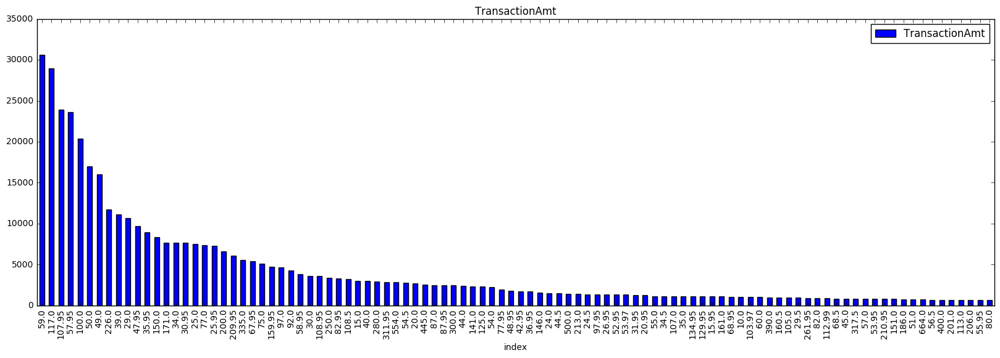

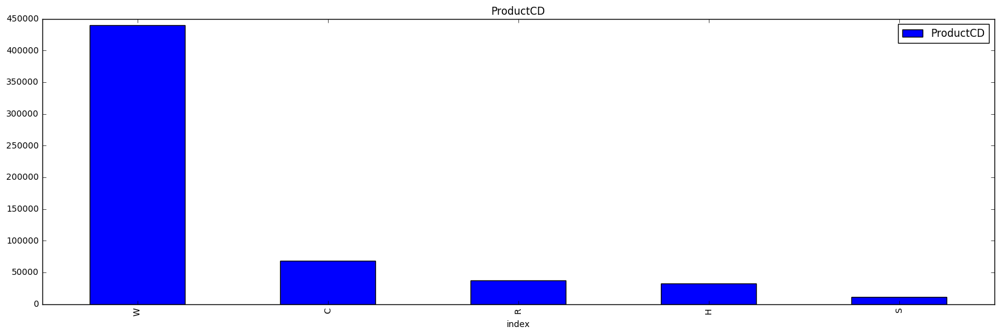

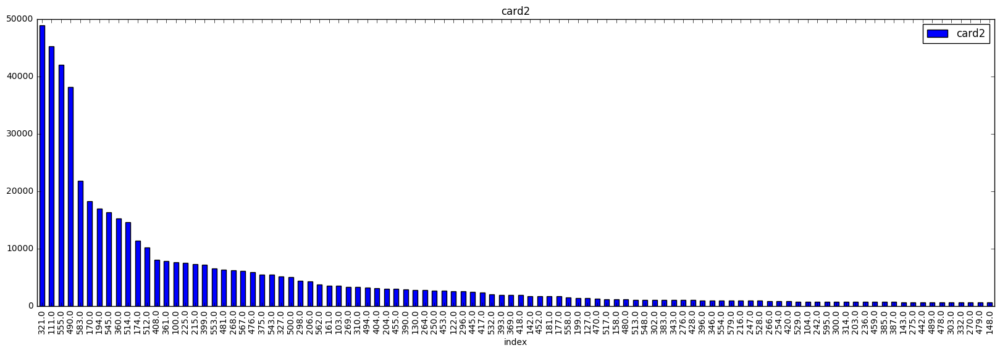

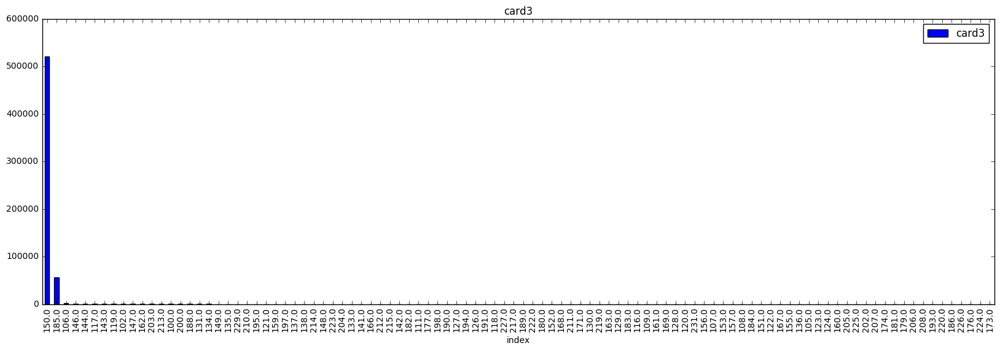

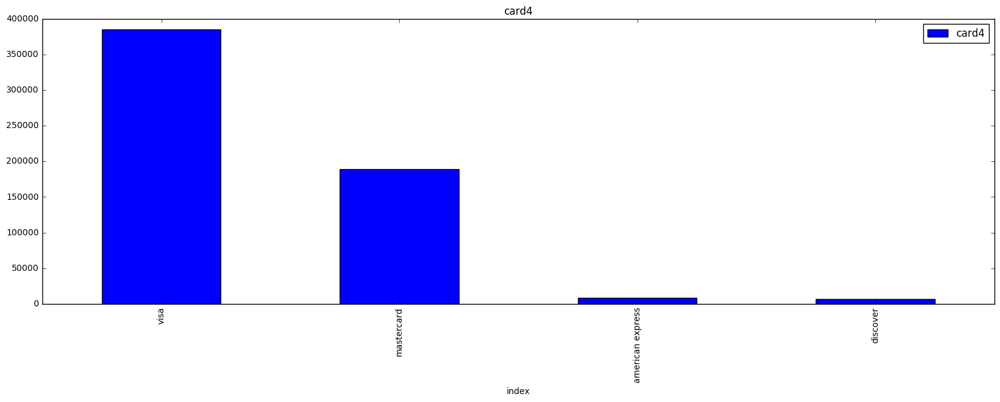

...

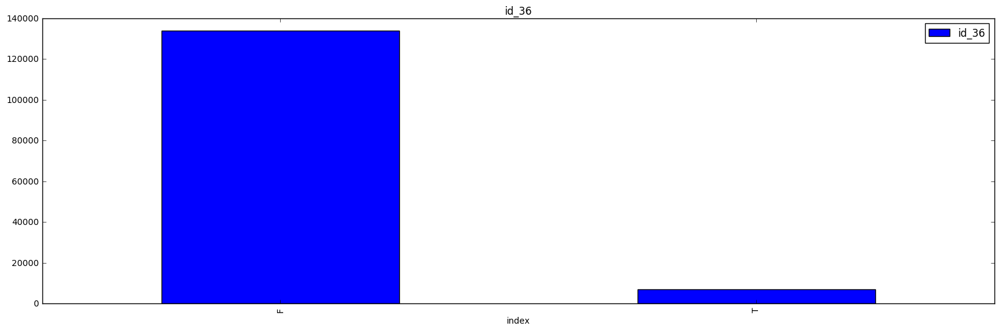

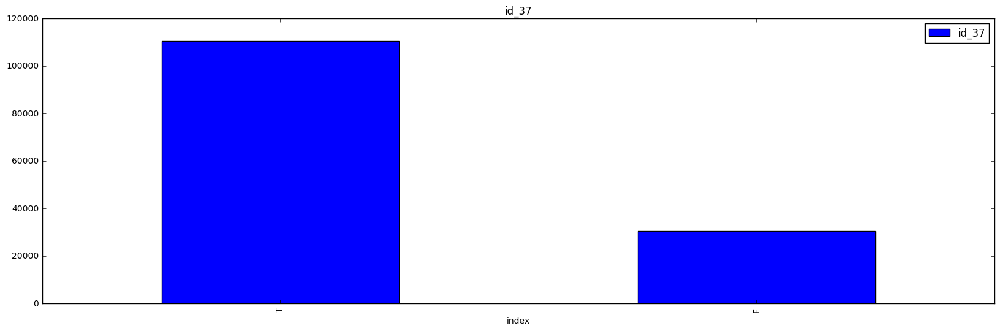

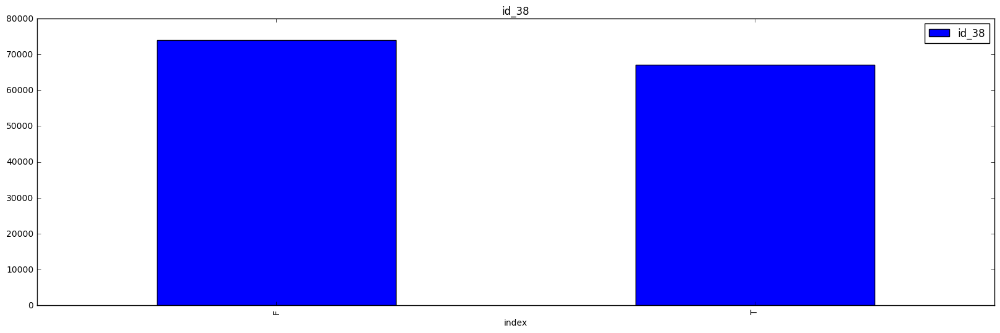

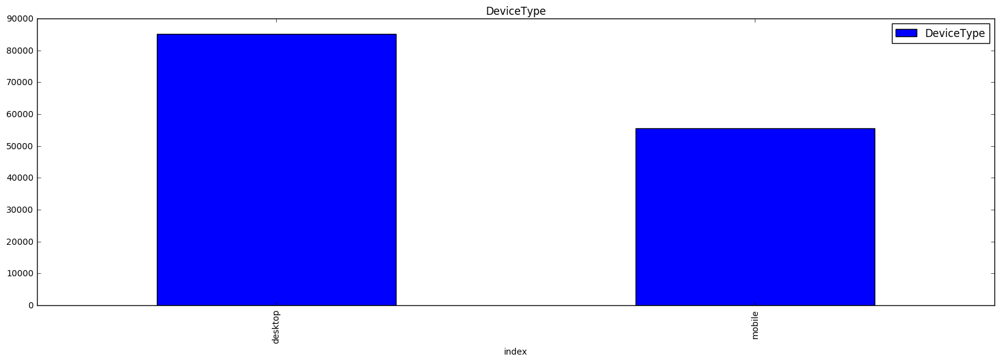

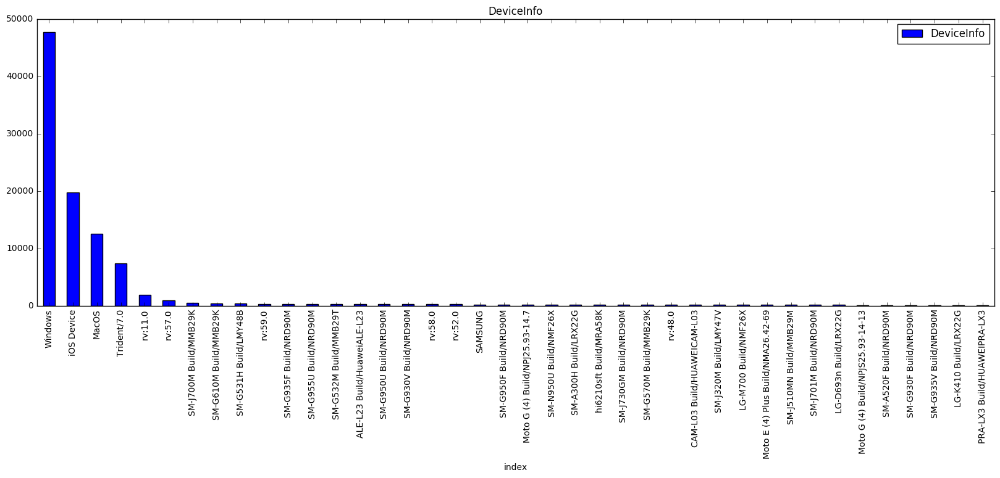

In [6]:
# Describe all features
for c in train.columns:
    tmp = train[c].nunique()
    print(c+": "+str(tmp)+" unique values")
    print(train[c].describe())
    print("---- ---- ---- ---- ----")
    type_c = str(train[c].dtype)
    if type_c == 'float64':
        pandas.DataFrame(train[c].value_counts()).reset_index().head(100).plot(x="index", y=c, title = c, kind = "bar", figsize=(20,6))
    elif type_c == 'object':
        pandas.DataFrame(train[c].value_counts()).reset_index().head(40).plot(x="index", y=c, title = c, kind = "bar", figsize=(20,6))

In [7]:
# Number of columns containing null values
df_null = pandas.DataFrame(train.isnull().any())
print(len(df_null[df_null[0]==True]))
df_null = pandas.DataFrame(test.isnull().any())
print(len(df_null[df_null[0]==True]))

414
385


In [8]:
def process_null_col(df):
    nullvals = df.isnull().any()
    null_cols=list(nullvals[nullvals==True].index)
    for nf in null_cols:
        type_c = str(df[nf].dtype)
        if type_c == 'float64':
            df[nf].fillna(round(df[nf].mean()), inplace=True)
        elif type_c == 'object':
            df[nf].fillna('N/A', inplace=True)
    return df

In [9]:
train = process_null_col(train)
test = process_null_col(test)

In [10]:
ID_col = ['TransactionID']
trans_date = ["TransactionDT"]
target_col = ["isFraud"]
num_cols= list(set(list(train.describe().columns))-set(target_col)-set(ID_col)-set(trans_date))
cat_cols = list(set(list(train.columns))-set(num_cols)-set(target_col)-set(ID_col)-set(trans_date))

#Create label encoders for categorical features
for var in cat_cols:
    number = LabelEncoder()
    train[var] = number.fit_transform(train[var].astype('str'))
    test[var] = number.fit_transform(test[var].astype('str'))

In [11]:
train

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.50,4,13926,363.0,150.0,2,142.0,...,10,27.0,260,0,1,1,1,1,0,806
1,2987001,0,86401,29.00,4,2755,404.0,150.0,3,102.0,...,10,27.0,260,0,1,1,1,1,0,806
2,2987002,0,86469,59.00,4,4663,490.0,150.0,4,166.0,...,10,27.0,260,0,1,1,1,1,0,806
3,2987003,0,86499,50.00,4,18132,567.0,150.0,3,117.0,...,10,27.0,260,0,1,1,1,1,0,806
4,2987004,0,86506,50.00,1,4497,514.0,150.0,3,102.0,...,124,32.0,164,4,2,0,2,2,2,955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,3577535,0,15811047,49.00,4,6550,363.0,150.0,4,226.0,...,10,27.0,260,0,1,1,1,1,0,806
590536,3577536,0,15811049,39.50,4,10444,225.0,150.0,3,224.0,...,10,27.0,260,0,1,1,1,1,0,806
590537,3577537,0,15811079,30.95,4,12037,595.0,150.0,3,224.0,...,10,27.0,260,0,1,1,1,1,0,806
590538,3577538,0,15811088,117.00,4,7826,481.0,150.0,3,224.0,...,10,27.0,260,0,1,1,1,1,0,806


In [24]:
clf = LogisticRegression(C=1e5)
clf.fit(train[num_cols+cat_cols], train["isFraud"])

C:\Users\aau1\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\aau1\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


LogisticRegression(C=100000.0, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [25]:
y_pred = clf.predict(test[num_cols+cat_cols])